In [32]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
import scanorama
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Глобальное окружение

## Подгрузим данные

In [33]:
os.listdir('../data/anndata_objects/macaque')

['macaque.h5ad',
 'macaque_0701.h5ad',
 'macaque_0703.h5ad',
 'macaque_0704.h5ad',
 'macaque_nb0904.h5ad']

In [34]:
adata = sc.read_h5ad('../data/anndata_objects/macaque/macaque.h5ad')
adata.obs_names_make_unique()
adata

C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 14621 × 21591
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

Посмотрим есть ли неразмеченые споты

In [35]:
adata.obs.label.isna().value_counts()

False    14611
True        10
Name: label, dtype: int64

In [36]:
adata.obs.label.value_counts()

L3             4614
L5             2507
L4             1799
L1             1483
L6a            1351
L2             1196
Empty spots     680
L6b             537
WM              444
Name: label, dtype: int64

In [37]:
samples = list(adata.uns['spatial'].keys())

## Посмотрим на изображения

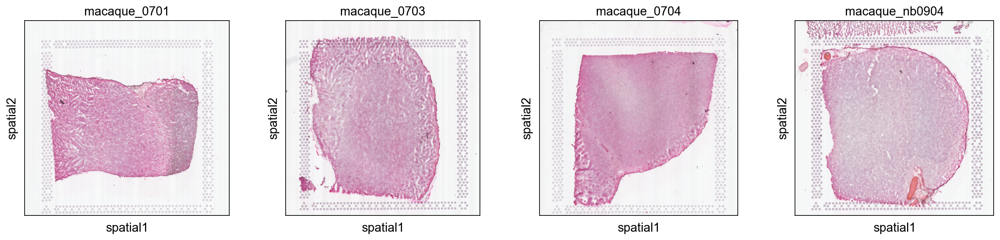

In [38]:
sq.pl.spatial_scatter(adata, library_key='sample_id', title=samples, ncols=5)

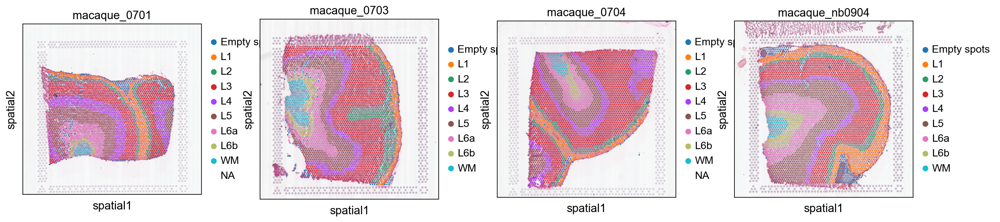

In [39]:
sq.pl.spatial_scatter(adata, color=['label'], library_key='sample_id', ncols=5, title=samples)

## Посмотрим на метрики

In [40]:
# add info on mitochondrial and hemoglobin genes to the objects.
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

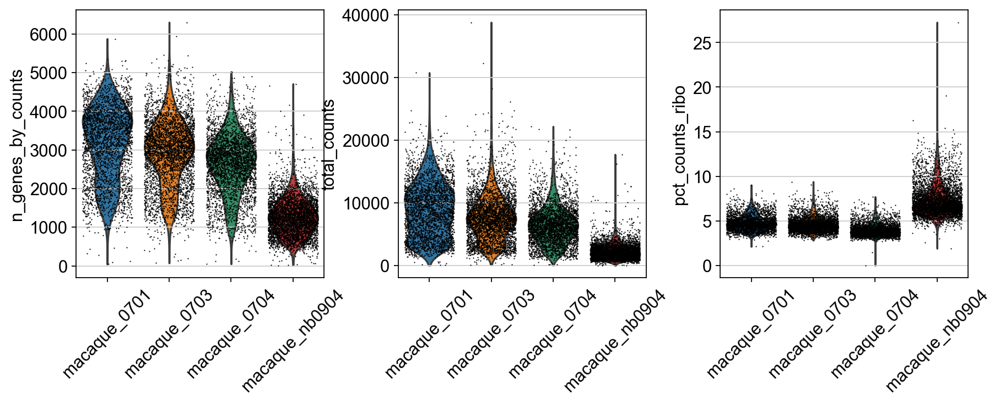

In [41]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo'],
             jitter=0.4, groupby = 'sample_id', rotation= 45)

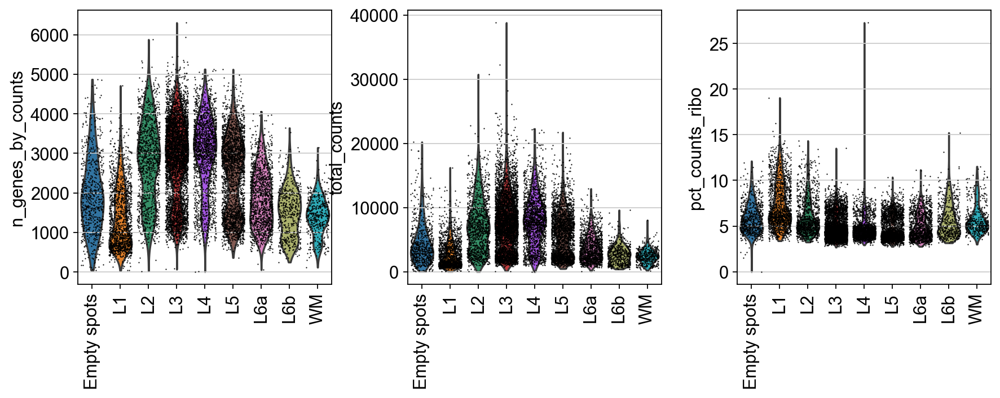

In [42]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo'],
             jitter=0.4, groupby = 'label', rotation= 90)

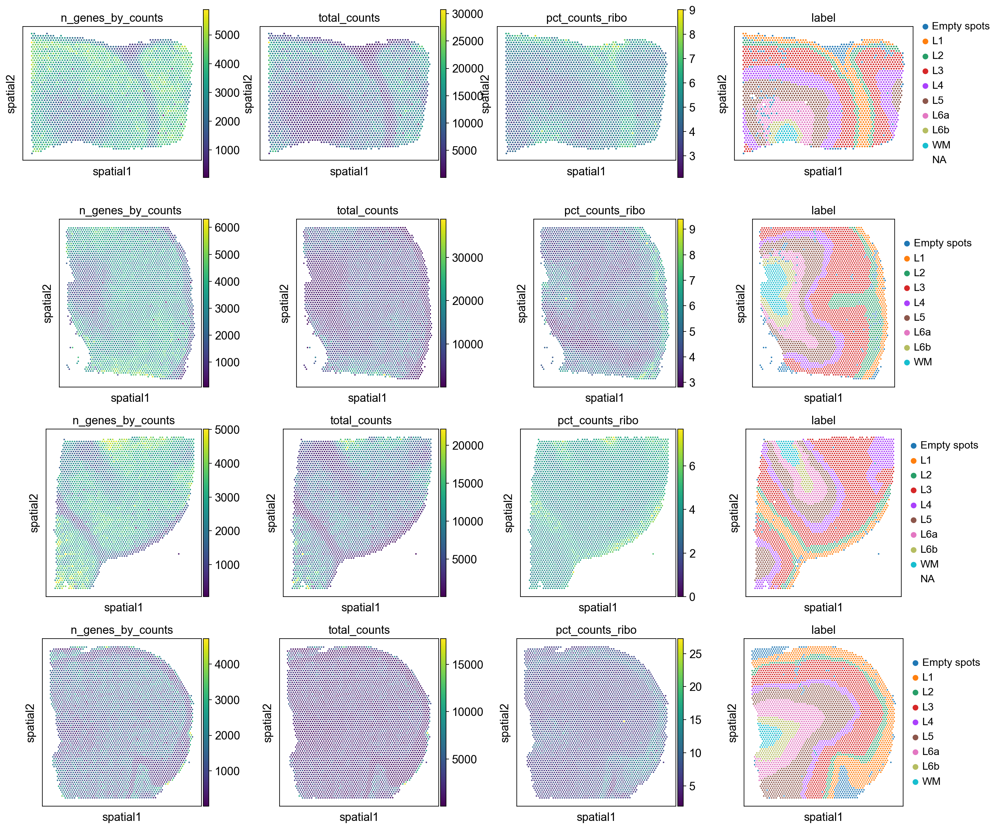

In [46]:
sq.pl.spatial_scatter(adata,
                      color=['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'label'],
                      library_key='sample_id', ncols=4, img=False)

## PCA

In [44]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:01:47)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


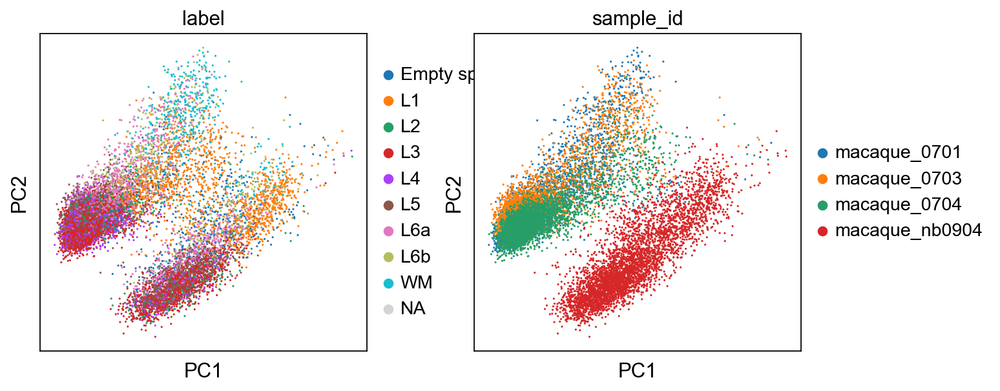

In [45]:
sc.pl.pca(adata, 
          color=['label', 'sample_id'],
          ncols=2, show=True)